<a href="https://colab.research.google.com/github/belaz1918/CNN-Explainer/blob/master/Generative_Model_Tutorial(Problem).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generative Model Tutorial: VAE, Diffusion Playground
### TA: Jaehoon Yoo (wogns98@kaist.ac.kr), Nguyen Tuan Kiet (kietngt00@kaist.ac.kr)
* In this tutorial, you will train the generative models based on variational inference (VAE, Diffusion) and interpolate the images on the learned latent space.
* Due to the expensive training cost of diffusion and VAE models, we will give you the pretrained model with their training logs.
* You may train your own model from scratch (We do not recommend to train from scratch on Colab. Please use your local machine if you have one.) or finetune the given pretrained models.
* Please read the tutorial guide in the [link](https://docs.google.com/presentation/d/1tBOVKAZ40VqRldzbPEpQ1iXSnMp0gptT_bFg-iWv2iE/edit#slide=id.p). We hope you enjoy this tutorial and understand VAEs and Diffusion Models in depth.


### Google Colab setup & Dataset preparation
0. You will need about 3 GB to run this tutorial. (You may run the tutorial with 1.5 GB. Please follow the below guide if you want to run with 1.5 GB.)
1. Clone this file and the attached tutorial.zip in the same folder.
2. The unzip process will be done by the below scripts

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
root = "/content/drive/MyDrive/CS371/assignment 5/deploy" # Change it to match your directory

unzip_root = root # If you have 3 GB storage.
# unzip_root = "/tmp" # If you only have 1.5 GB storage.

zip_dir = f"{root}/tutorial.zip"
data_dir = f"{root}/data/afhq"

In [ ]:
# Run this cell if you don't have "ckpts", "logs", "data" folder in the root directory.
!unzip -q "{zip_dir}" -d "{unzip_root}"

In [ ]:
# Run this cell if you need to save the storage. The below will remove the zip file.

# !rm -r "{zip_dir}"
# !cp -r "{unzip_root}/*" ./

# Utility Functions

In [ ]:
import os
from glob import glob
from PIL import Image

import torch
import torch.nn as nn
from torch.nn import init
import torch.nn.functional as F
import torch.utils.data as data
from torch.utils.data import DataLoader

import torchvision
import torchvision.transforms as transforms
import math
import numpy as np
import matplotlib.pyplot as plt

def fix_seed(seed):
    torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)

def show_images(dataset, num_samples=4):
    """ Plots some samples from the dataset """
    plt.subplots(nrows=1, ncols=num_samples, figsize=(2*num_samples, 2))
    for i, img in enumerate(dataset):
        if i == num_samples:
            break
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img.permute(1, 2, 0) * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

def plt_figure_to_numpy(figure):
    """ Converts a matplotlib figure to a numpy array """
    figure.canvas.draw()
    data = np.frombuffer(figure.canvas.tostring_rgb(), dtype=np.uint8)
    data = data.reshape(figure.canvas.get_width_height()[::-1] + (3,))
    # change to C, H, W
    data = np.transpose(data, (2, 0, 1))
    return data

@torch.no_grad()
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    image = image.clamp(-1, 1)
    plt.imshow(reverse_transforms(image))

## Investigating the dataset (AFHQ-Cats)

In [ ]:
class AFHQCats(data.Dataset):
    def __init__(self, root, train=True, transform=None,):
        self.root = root
        self.transform = transform
        self.train = train  # training set or test set

        if train:
            folder = 'train/cat'
        else:
            folder = 'val/cat'

        self.fnames = glob(os.path.join(root, folder, '*.jpg'))
        self.fnames.sort()

    def __len__(self):
        return len(self.fnames)

    def __getitem__(self, index):
        fname = self.fnames[index]
        img = Image.open(fname).convert('RGB')

        if self.transform is not None:
            img = self.transform(img)

        return img

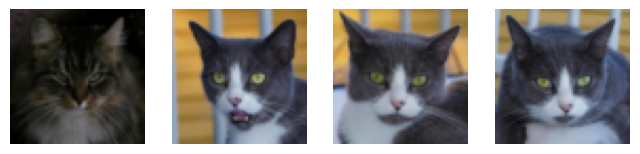

In [ ]:
IMG_SIZE = 64
BATCH_SIZE = 16

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

data = AFHQCats(root=data_dir, train=True, transform=train_transform)
show_images(data)

# Building the Diffusion Model


## Building UNet Architecture

In [ ]:
class DownSample(nn.Module):
    def __init__(self, in_ch):
        super().__init__()
        self.main = nn.Conv2d(in_ch, in_ch, 3, stride=2, padding=1)
        self.initialize()

    def initialize(self):
        init.xavier_uniform_(self.main.weight)
        init.zeros_(self.main.bias)

    def forward(self, x, temb):
        x = self.main(x)
        return x


class UpSample(nn.Module):
    def __init__(self, in_ch):
        super().__init__()
        self.main = nn.Conv2d(in_ch, in_ch, 3, stride=1, padding=1)
        self.initialize()

    def initialize(self):
        init.xavier_uniform_(self.main.weight)
        init.zeros_(self.main.bias)

    def forward(self, x, temb):
        _, _, H, W = x.shape
        x = F.interpolate(x, scale_factor=2, mode="nearest")
        x = self.main(x)
        return x


class AttnBlock(nn.Module):
    def __init__(self, in_ch):
        super().__init__()
        self.group_norm = nn.GroupNorm(32, in_ch)
        self.proj_q = nn.Conv2d(in_ch, in_ch, 1, stride=1, padding=0)
        self.proj_k = nn.Conv2d(in_ch, in_ch, 1, stride=1, padding=0)
        self.proj_v = nn.Conv2d(in_ch, in_ch, 1, stride=1, padding=0)
        self.proj = nn.Conv2d(in_ch, in_ch, 1, stride=1, padding=0)
        self.initialize()

    def initialize(self):
        for module in [self.proj_q, self.proj_k, self.proj_v, self.proj]:
            init.xavier_uniform_(module.weight)
            init.zeros_(module.bias)
        init.xavier_uniform_(self.proj.weight, gain=1e-5)

    def forward(self, x):
        B, C, H, W = x.shape
        h = self.group_norm(x)
        q = self.proj_q(h)
        k = self.proj_k(h)
        v = self.proj_v(h)

        q = q.permute(0, 2, 3, 1).view(B, H * W, C)
        k = k.view(B, C, H * W)
        w = torch.bmm(q, k) * (int(C) ** (-0.5))
        assert list(w.shape) == [B, H * W, H * W]
        w = F.softmax(w, dim=-1)

        v = v.permute(0, 2, 3, 1).view(B, H * W, C)
        h = torch.bmm(w, v)
        assert list(h.shape) == [B, H * W, C]
        h = h.view(B, H, W, C).permute(0, 3, 1, 2)
        h = self.proj(h)

        return x + h


class ResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, tdim, dropout, attn=False):
        super().__init__()
        self.block1 = nn.Sequential(
            nn.GroupNorm(32, in_ch),
            nn.SiLU(),
            nn.Conv2d(in_ch, out_ch, 3, stride=1, padding=1),
        )

        self.tdim = tdim
        if tdim > 0:
            self.temb_proj = nn.Sequential(
                nn.SiLU(),
                nn.Linear(tdim, out_ch),
            )
        self.block2 = nn.Sequential(
            nn.GroupNorm(32, out_ch),
            nn.SiLU(),
            nn.Dropout(dropout),
            nn.Conv2d(out_ch, out_ch, 3, stride=1, padding=1),
        )
        if in_ch != out_ch:
            self.shortcut = nn.Conv2d(in_ch, out_ch, 1, stride=1, padding=0)
        else:
            self.shortcut = nn.Identity()
        if attn:
            self.attn = AttnBlock(out_ch)
        else:
            self.attn = nn.Identity()
        self.initialize()

    def initialize(self):
        for module in self.modules():
            if isinstance(module, (nn.Conv2d, nn.Linear)):
                init.xavier_uniform_(module.weight)
                init.zeros_(module.bias)
        init.xavier_uniform_(self.block2[-1].weight, gain=1e-5)

    def forward(self, x, temb):
        h = self.block1(x)
        if self.tdim > 0:
            h += self.temb_proj(temb)[:, :, None, None]
        h = self.block2(h)

        h = h + self.shortcut(x)
        h = self.attn(h)
        return h


class TimeEmbedding(nn.Module):
    def __init__(self, hidden_size, frequency_embedding_size=256):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(frequency_embedding_size, hidden_size, bias=True),
            nn.SiLU(),
            nn.Linear(hidden_size, hidden_size, bias=True),
        )
        self.frequency_embedding_size = frequency_embedding_size

    @staticmethod
    def timestep_embedding(t, dim, max_period=10000):
        """
        Create sinusoidal timestep embeddings.
        :param t: a 1-D Tensor of N indices, one per batch element.
                          These may be fractional.
        :param dim: the dimension of the output.
        :param max_period: controls the minimum frequency of the embeddings.
        :return: an (N, D) Tensor of positional embeddings.
        """
        half = dim // 2
        freqs = torch.exp(
            -math.log(max_period)
            * torch.arange(start=0, end=half, dtype=torch.float32)
            / half
        ).to(device=t.device)
        args = t[:, None].float() * freqs[None]
        embedding = torch.cat([torch.cos(args), torch.sin(args)], dim=-1)
        if dim % 2:
            embedding = torch.cat(
                [embedding, torch.zeros_like(embedding[:, :1])], dim=-1
            )
        return embedding

    def forward(self, t):
        if t.ndim == 0:
            t = t.unsqueeze(-1)
        t_freq = self.timestep_embedding(t, self.frequency_embedding_size)
        t_emb = self.mlp(t_freq)
        return t_emb


class UNet(nn.Module):
    def __init__(self, image_resolution=64, ch=128, ch_mult=[1,2,2,2], attn=[1], num_res_blocks=4, dropout=0.1, vae=False):
        super().__init__()
        self.image_resolution = image_resolution
        self.vae = vae
        assert all([i < len(ch_mult) for i in attn]), 'attn index out of bound'
        tdim = ch * 4 if not vae else 0

        if tdim > 0:
            self.time_embedding = TimeEmbedding(tdim)
        else:
            self.time_embedding = nn.Identity()

        self.head = nn.Conv2d(3, ch, kernel_size=3, stride=1, padding=1)
        self.downblocks = nn.ModuleList()
        chs = [ch]  # record output channel when dowmsample for upsample
        now_ch = ch
        for i, mult in enumerate(ch_mult):
            out_ch = ch * mult
            for _ in range(num_res_blocks):
                self.downblocks.append(ResBlock(
                    in_ch=now_ch, out_ch=out_ch, tdim=tdim,
                    dropout=dropout, attn=(i in attn)))
                now_ch = out_ch
                chs.append(now_ch)
            if i != len(ch_mult) - 1:
                self.downblocks.append(DownSample(now_ch))
                chs.append(now_ch)

        if vae:
            for i in range(len(chs)):
                chs[i] = 0
            self.pre_conv = nn.Conv2d(now_ch, now_ch*2, 1, stride=1, padding=0)
            self.post_conv = nn.Conv2d(now_ch, now_ch, 1, stride=1, padding=0)

        self.middleblocks = nn.ModuleList([
            ResBlock(now_ch, now_ch, tdim, dropout, attn=True),
            ResBlock(now_ch, now_ch,
                     tdim, dropout, attn=False),
        ])

        self.upblocks = nn.ModuleList()
        for i, mult in reversed(list(enumerate(ch_mult))):
            out_ch = ch * mult
            for _ in range(num_res_blocks + 1):
                self.upblocks.append(ResBlock(
                    in_ch=chs.pop() + now_ch, out_ch=out_ch, tdim=tdim,
                    dropout=dropout, attn=(i in attn)))
                now_ch = out_ch
            if i != 0:
                self.upblocks.append(UpSample(now_ch))
        assert len(chs) == 0

        self.tail = nn.Sequential(
            nn.GroupNorm(32, now_ch),
            nn.SiLU(),
            nn.Conv2d(now_ch, 3, 3, stride=1, padding=1)
        )
        self.initialize()

    def initialize(self):
        init.xavier_uniform_(self.head.weight)
        init.zeros_(self.head.bias)
        init.xavier_uniform_(self.tail[-1].weight, gain=1e-5)
        init.zeros_(self.tail[-1].bias)

    def forward(self, x, timestep, class_label=None):
        # Timestep embedding
        temb = self.time_embedding(timestep)

        # Downsampling
        h = self.head(x)
        hs = [h]
        for layer in self.downblocks:
            h = layer(h, temb)
            hs.append(h)
        # Middle
        for layer in self.middleblocks:
            h = layer(h, temb)
        # Upsampling
        for layer in self.upblocks:
            if isinstance(layer, ResBlock):
                if self.vae:
                    hs.pop()
                else:
                    h = torch.cat([h, hs.pop()], dim=1)
            h = layer(h, temb)
        h = self.tail(h)

        assert len(hs) == 0
        return h

# P1. Implementing the VAE Model [(Problem Instruction)](https://docs.google.com/presentation/d/1tBOVKAZ40VqRldzbPEpQ1iXSnMp0gptT_bFg-iWv2iE/edit#slide=id.g31713ab6ed9_0_670)
* In this section, you will implement Variational AutoEncoder (VAE) and its loss function.
* Please follow the implementation guide in this link.

In [ ]:
class VAEModel(UNet):
    def __init__(self, beta=0.25):
        super().__init__(vae=True)
        self.beta = beta

    @torch.no_grad()
    def register_latent_shape(self, x):
        x = torch.zeros_like(x)
        shape = self.encode(x)[0].shape
        self.shape = shape[1:]

    def encode(self, x):
        # Downsampling
        h = self.head(x)
        for layer in self.downblocks:
            h = layer(h, None)
        h = self.pre_conv(h)
        mu, logvar = h.chunk(2, dim=1)
        logvar = logvar.clamp(-4, 4) # for training stability
        return mu, logvar

    def decode(self, z):
        z = self.post_conv(z)
        # Middle
        for layer in self.middleblocks:
            z = layer(z, None)
        # Upsampling
        for layer in self.upblocks:
            z = layer(z, None)
        x = self.tail(z)
        return x

    def posterior_sampling(self, mu, logvar):
        #############################################
        # P1-1. Slide #9
        #
        #
        #
        #
        #############################################
        return z

    def reconstruct(self, x):
        #############################################
        # P1-2. Slide #10
        #
        #
        #
        #
        #
        #############################################
        return x_recon, mu, logvar

    def training_step(self, x, global_step, writer):
        # writer is tensorboard.Writer class
        x_recon, mu, logvar = self.reconstruct(x)
        #############################################
        # P1-3.
        recon_loss = # Slide #11
        kl_loss =    # Slide #12
        #############################################
        loss = recon_loss + kl_loss

        writer.add_scalar("recon_loss", recon_loss, global_step)
        writer.add_scalar("kl_loss", kl_loss, global_step)
        writer.add_scalar("loss", loss, global_step)
        return loss

    def prior_sampling(self, batch_size):
        device = next(self.parameters()).device
        #############################################
        # P1-4. # Slide #13
        z =
        #############################################
        return z


    @torch.inference_mode()
    def log_image(self, x, global_step, writer):
        B = x.shape[0]
        x_recon = self.reconstruct(x)[0]
        #############################################
        # P1-5. # Slide #13
        x_gen =
        #############################################

        writer.add_images("input", x, global_step)
        writer.add_images("recon", x_recon.clamp(-1, 1), global_step)
        writer.add_images("gen", x_gen.clamp(-1, 1), global_step)


# P2. Implementing the Diffusion Model [(Problem Instruction)](https://docs.google.com/presentation/d/1tBOVKAZ40VqRldzbPEpQ1iXSnMp0gptT_bFg-iWv2iE/edit#slide=id.g31713ab6ed9_0_675)

In [ ]:
class DiffusionModel(UNet):
    def __init__(self, timesteps=1000,):
        super().__init__()
        self.shape = None
        self.timesteps = timesteps
        self.betas = self.linear_beta_schedule(timesteps)
        self.alphas = 1. - self.betas
        ###########################################################
        # P2-1. Slide #22
        self.alphas_cumprod =
        self.alphas_cumprod_prev =
        self.sqrt_recip_alphas =
        self.sqrt_alphas_cumprod =
        self.sqrt_one_minus_alphas_cumprod =
        self.posterior_variance =
        ###########################################################

    @staticmethod
    def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
        return torch.linspace(start, end, timesteps)

    @staticmethod
    def get_index_from_list(vals, t, x_shape):
        """
        Returns a specific index t of a passed list of values vals
        while considering the batch dimension.
        """
        batch_size = t.shape[0]
        out = vals.gather(-1, t.cpu())
        return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

    def forward_diffusion_sample(self, x_0, t):
        """
        Takes an image and a timestep as input and
        returns the noisy version of it
        """
        device = x_0.device
        ###########################################################
        # P2-2. Slide #23
        #
        #
        #
        #
        #
        #
        #
        ###########################################################

        return x_t, noise

    @torch.no_grad()
    def sample_timestep(self, x, t):
        """
        Calls the model to predict the noise in the image and returns
        the denoised image.
        Applies noise to this image, if we are not in the last step yet.
        """
        ###########################################################
        # P2-3. Slide #25, 26
        model_mean =
        model_variance =
        ###########################################################

        if t == 0:
            return model_mean
        else:
            noise = torch.randn_like(x)
            return model_mean + torch.sqrt(model_variance) * noise

    def training_step(self, x, global_step, writer):
        ###########################################################
        # P2-4. Slide #27
        #
        #
        #
        #
        #
        #
        ###########################################################
        writer.add_scalar("loss", loss, global_step)
        return loss

    @torch.inference_mode()
    def log_image(self, x, global_step, writer):
        device = next(self.parameters()).device
        T = self.timesteps
        img_size = IMG_SIZE
        img = torch.randn((x.shape[0], 3, img_size, img_size), device=device)
        num_images = 10
        stepsize = int(T/num_images)

        plt.figure(figsize=(15,2))
        plt.axis('off')
        for i in range(0,T)[::-1]:
            t = torch.full((1,), i, device=device, dtype=torch.long)
            img = self.sample_timestep(img, t)
            if i % stepsize == 0:
                plt.subplot(1, num_images, int(i/stepsize)+1)
                show_tensor_image(img.detach().cpu()[0])
                plt.title(f"t={i}")
                plt.axis('off')
        denoising = plt_figure_to_numpy(plt.gcf())
        x_gen = img
        writer.add_images("gen", x_gen.clamp(-1, 1), global_step)
        writer.add_image("denoise", denoising, global_step)


### Prepare Dataset and Test the Forward Process

In [ ]:
def load_transformed_dataset(data_dir):
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    train = AFHQCats(data_dir, True, data_transform)
    test = AFHQCats(data_dir, False, data_transform)
    return torch.utils.data.ConcatDataset([train, test])

data = load_transformed_dataset(data_dir)
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True, num_workers=8)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


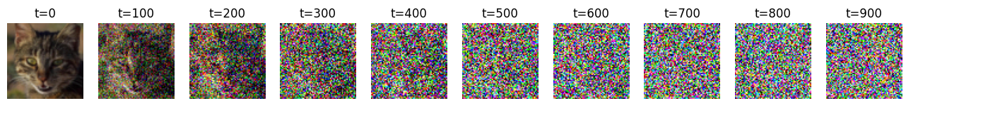

In [ ]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

model = DiffusionModel(1000)

plt.figure(figsize=(18,2))
plt.axis('off')
num_images = 10
T = model.timesteps
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = model.forward_diffusion_sample(image, t)
    show_tensor_image(img)
    plt.axis('off')
    plt.title(f't={idx}')

# Train the Models

### Open Tensorboard

In [ ]:
# load_ext tensorboard and open tensorboard

%load_ext tensorboard
%tensorboard --logdir "{root}/logs"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
from torch.optim import Adam
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
device = "cuda"

def train_model(model, writer, max_epoch=100, model_type='diffusion', clipping=False, resume=True):
    print("Num params: ", sum(p.numel() for p in model.parameters()))
    optimizer = Adam(model.parameters(), lr=2e-4)
    start_epoch = 0
    if os.path.exists(f"{root}/ckpts/{model_type}.pth") and resume:
        ckpt = torch.load(f"{root}/ckpts/{model_type}.pth")
        model.load_state_dict(ckpt['state_dict'])
        optimizer.load_state_dict(ckpt['optimizer'])
        start_epoch = ckpt['epoch']
        print("Model loaded!")

    for epoch in range(start_epoch, max_epoch):
        pbar = tqdm(enumerate(dataloader), total=len(dataloader), leave=False)
        for step, batch in pbar:
            if not hasattr(model, "shape"):
                if hasattr(model, "register_latent_shape"):
                    model.register_latent_shape(batch.to(device))
            if epoch % 5 == 0 and step==0:
                model.log_image(batch.to(device), epoch, writer)
                ckpt = {}
                ckpt['epoch'] = epoch
                ckpt['optimizer'] = optimizer.state_dict()
                ckpt['state_dict'] = model.state_dict()
                torch.save(ckpt, f"{root}/ckpts/{model_type}.pth")
            optimizer.zero_grad()
            loss = model.training_step(batch.to(device), epoch * len(dataloader) + step, writer)
            loss.backward()
            if clipping:
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
            optimizer.step()
            pbar.set_description(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
    model.log_image(batch.to(device), epoch, writer)
    ckpt = {}
    ckpt['epoch'] = epoch
    ckpt['optimizer'] = optimizer.state_dict()
    ckpt['state_dict'] = model.state_dict()
    torch.save(ckpt, f"{root}/ckpts/{model_type}.pth")
    print("Training done!")

## Training Diffusion model

In [ ]:
# fix seed for reproducibility
fix_seed(42)
os.makedirs(f"{root}/logs", exist_ok=True)
os.makedirs(f"{root}/ckpts", exist_ok=True)

model_type = 'diffusion'
epochs=200
writer = SummaryWriter(f"{root}/logs/{model_type}")
model = DiffusionModel().to(device)
train_model(model, writer, epochs, model_type, resume=True)

Num params:  58753283
Model loaded!


Epoch 155 | step 094 Loss: 0.02561839669942856 :  27%|████████████████████████████████████████▋                                                                                                              | 95/353 [01:35<00:58,  4.42it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Epoch 162 | step 332 Loss: 0.01362321712076664 :  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 333/353 [01:15<00:04,  4.44it/s]

## Training VAE Model

In [ ]:
# fix seed for reproducibility
fix_seed(42)
os.makedirs(f"{root}/logs", exist_ok=True)
os.makedirs(f"{root}/ckpts", exist_ok=True)

model_type = 'vae'
epochs=1000
writer = SummaryWriter(f"{root}/logs/{model_type}")
model = VAEModel(beta=1.0).to(device)
train_model(model, writer, epochs, model_type, clipping=True, resume=True)

Num params:  42773379
Model loaded!


Epoch 199 | step 081 Loss: 0.026972148567438126 :  23%|████████████████████████████████████████████████████████████████                                                                                                                                                                                                                    | 82/353 [00:16<00:50,  5.40it/s]

# Interpolating Images with Generative Models

## Load Generative Models

In [ ]:
vae = VAEModel().to(device)
diffusion = DiffusionModel().to(device)

vae_ckpt = torch.load(f"{root}/ckpts/vae.pth")
diffusion_ckpt = torch.load(f"{root}/ckpts/diffusion.pth")

vae.load_state_dict(vae_ckpt['state_dict'])
diffusion.load_state_dict(diffusion_ckpt['state_dict'])

<ipython-input-16-89d06f83d126>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae_ckpt = torch.load(f"{root}/ckpts/vae.pth")
<ipython-input-16-89d06f83d126>:5: FutureWarn

<All keys matched successfully>

# Prepare for Interpolation
* In this section, you will interpolate the given images on the learned latent space. (https://docs.google.com/presentation/d/1tBOVKAZ40VqRldzbPEpQ1iXSnMp0gptT_bFg-iWv2iE/edit#slide=id.g31713ab6ed9_0_132)
* You may change imageA and imageB in the below cell. Please enjoy your model!

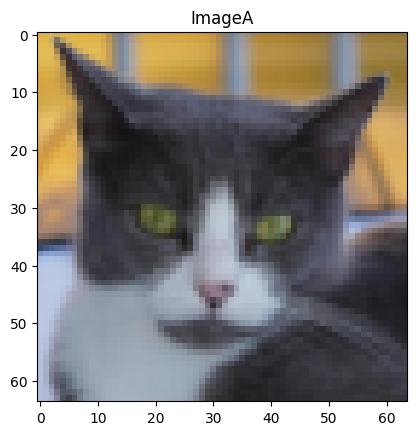

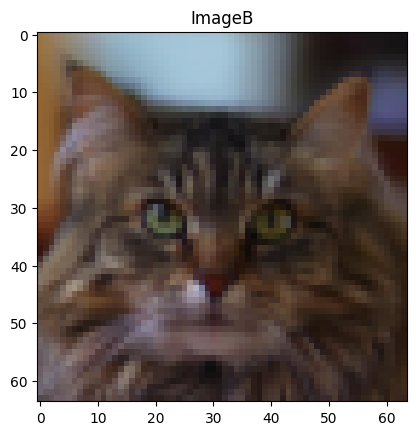

In [ ]:
imageA, imageB = data[2], data[12]
imageA, imageB = imageA.unsqueeze(0).to(device), imageB.unsqueeze(0).to(device)
imageAB = torch.cat([imageA, imageB], dim=0)

show_tensor_image(imageA[0].cpu())
plt.title('ImageA')
plt.show()

show_tensor_image(imageB[0].cpu())
plt.title('ImageB')
plt.show()


In [ ]:
def visualize_interpolated(interpolated, imageA, imageB):
    plt.figure(figsize=(22, 2))
    labels = [f"alpha={alpha:.1f}" for alpha in np.linspace(0, 1, 10)]
    labels = ['Image A'] + labels + ['Image B']
    vis_images = torch.cat([imageA, interpolated, imageB], dim=0)
    for i, (img, label) in enumerate(zip(vis_images, labels)):
        plt.subplot(1, len(vis_images), i+1)
        show_tensor_image(img.cpu())
        plt.axis('off')
        plt.title(label)
    plt.show()

## Interpolating Images with VAE
1. encode image A and B
2. get latents z_A and z_B
3. interpolate z_A and z_B
4. decode interpolated z and visualize

In [ ]:
@torch.inference_mode()
def interpolate_vae(model, imageAB):
    zAB = model.encode(imageAB)[0] # we will use the mean of the distribution
    zA, zB = zAB.chunk(2, dim=0)

    # interpolate and decode.
    latents = [(1 - alpha) * zA + alpha * zB for alpha in np.linspace(0, 1, 10)]
    latents = torch.cat(latents, dim=0)
    interpolated = model.decode(latents)
    return interpolated

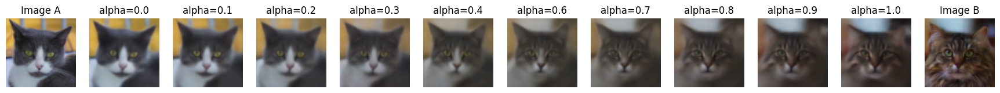

In [ ]:
interpolated = interpolate_vae(vae, imageAB)
visualize_interpolated(interpolated, imageA, imageB)

## Interpolating Images with Diffusion Model (Section 4.4 in DDPM(Ho et al., 2020))
1. encode image A and B
2. forward image A and B upto t.
3. interpolate the noised images.
4. denoise interpolated images and visualize


In [ ]:
@torch.inference_mode()
def interpolate_diff(model, T=500, imageAB=None):
    if T==0:
        zAB = imageAB
    else:
        t = torch.full((1,), T, device=device, dtype=torch.long)
        zAB = model.forward_diffusion_sample(imageAB, t)[0]
    zA, zB = zAB.chunk(2, dim=0)
    latents = [(1 - alpha) * zA + alpha * zB for alpha in np.linspace(0, 1, 10)]
    latents = torch.cat(latents, dim=0)
    for i in tqdm(range(0,T)[::-1], leave=False):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        latents = model.sample_timestep(latents, t)
    return latents # =interpolated

Interpoating at T=999


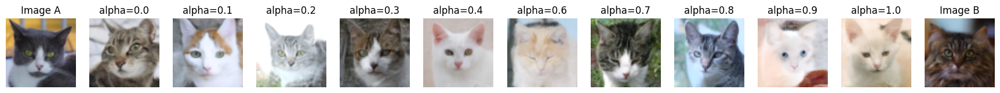

Interpoating at T=799


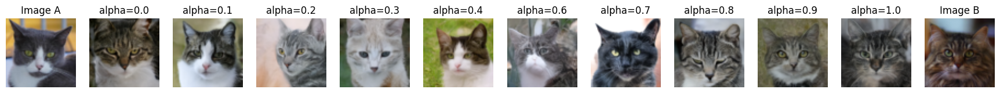

Interpoating at T=599


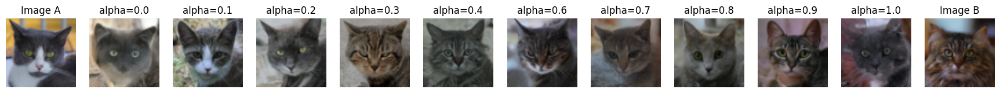

Interpoating at T=399


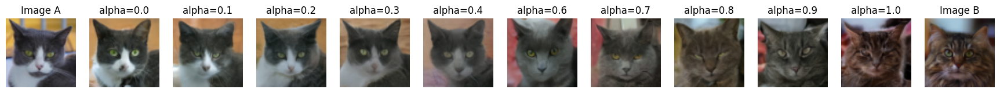

Interpoating at T=199


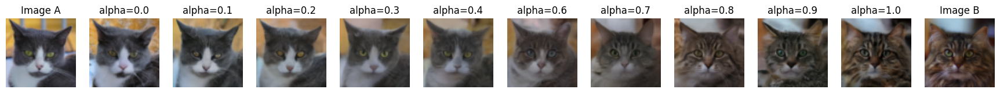

Interpoating at T=0


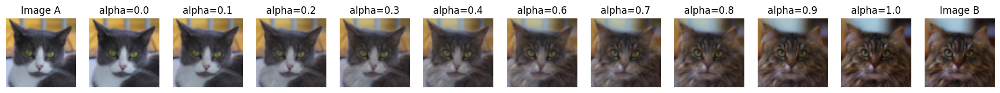

In [ ]:
for t in [999, 799, 599, 399, 199, 0]:
    print(f"Interpoating at T={t}")
    interpolated = interpolate_diff(diffusion, t, imageAB)
    visualize_interpolated(interpolated, imageA, imageB)